In [28]:
import sys
sys.path.insert(0, '/home/ggorin/projects/monod/src/')

In [90]:
# import monod
# from monod import preprocess, extract_data, cme_toolbox, inference, analysis

import monod
from monod.preprocess import *
from monod.extract_data import extract_data
import monod.cme_toolbox as cme_toolbox
from monod.cme_toolbox import CMEModel
import monod.inference as inference
from monod.inference import InferenceParameters, GradientInference
import monod.analysis as analysis
from monod.analysis import *


In [30]:
import pandas as pd
import numpy as np
import loompy as lp
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
import scipy.stats
import os



In [31]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [32]:
meta_path = "/home/tchari/metadata/"
meta = pd.read_csv(meta_path+'germCell_meta.csv')
meta.head()

,identity,cell_barcode
0,170830_AGPM_E10,170830_AGPM_E10:AGGTCATGTTGTCGCGx
1,170830_AGPM_E10,170830_AGPM_E10:ATCTGCCGTGCGAAACx
2,170830_AGPM_E10,170830_AGPM_E10:CAAGGCCCAAAGGAAGx
3,170830_AGPM_E10,170830_AGPM_E10:CAAGTTGTCCCATTTAx
4,170830_AGPM_E10,170830_AGPM_E10:CGTGTCTTCCAGAGGAx


In [33]:
np.unique(meta['identity'])

array(['170313_O_E16', '170313_T_E16', '170712_O_E16', '170712_T_E16',
       '170724_O_E12', '170724_T_E12', '170726_T_E13', '170802_T_E13',
       '170814_AGPF_E11', '170814_AGPM_E11', '170816_O_E12',
       '170816_T_E12', '170823_AGPF_E11', '170823_AGPM_E11',
       '170828_AGPF_E10', '170828_AGPM_E10', '170830_AGPF_E10',
       '170830_AGPM_E10', '180222_O_E13', '180410_O_E13'], dtype=object)

In [34]:
np.sum(meta['identity'].isin(['170830_AGPM_E10']))

10

In [35]:
dataset_meta = ['allconds']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [[i] for i in np.unique(meta['identity'])]

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['germ_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200524_mouse_genome_polyA_cum_1' 

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/germcell_splicing/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

dataset_meta:  ['allconds']

dataset_names:  ['germ_allconds_170313_O_E16', 'germ_allconds_170313_T_E16', 'germ_allconds_170712_O_E16', 'germ_allconds_170712_T_E16', 'germ_allconds_170724_O_E12', 'germ_allconds_170724_T_E12', 'germ_allconds_170726_T_E13', 'germ_allconds_170802_T_E13', 'germ_allconds_170814_AGPF_E11', 'germ_allconds_170814_AGPM_E11', 'germ_allconds_170816_O_E12', 'germ_allconds_170816_T_E12', 'germ_allconds_170823_AGPF_E11', 'germ_allconds_170823_AGPM_E11', 'germ_allconds_170828_AGPF_E10', 'germ_allconds_170828_AGPM_E10', 'germ_allconds_170830_AGPF_E10', 'germ_allconds_170830_AGPM_E10', 'germ_allconds_180222_O_E13', 'germ_allconds_180410_O_E13']
len(dataset_names):  20

loom_filepaths:  ['/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/all

Dataset allconds. 
	14750 barcodes in loom, 12897 pass filter. 170830_AGPM_E10:AGGTCATGTTGTCGCGx170830_AGPM_E10:ATCTGCCGTGCGAAACx170830_AGPM_E10:CAAGGCCCAAAGGAAGx170830_AGPM_E10:CAAGTTGTCCCATTTAx170830_AGPM_E10:CGTGTCTTCCAGAGGAx170830_AGPM_E10:CGTCTACAGCCACGCTx170830_AGPM_E10:GCATGATAGTCCTCCTx170830_AGPM_E10:GGACGTCGTAGCGATGx170830_AGPM_E10:GGTGAAGGTTTGGCGCx170830_AGPM_E10:GTACGTAGTCGCATATx170828_AGPM_E10:ACCTTTATCGCACTCTx170828_AGPM_E10:ACTGAGTCACGGTTTAx170828_AGPM_E10:AGTTGGTGTCTTGCGGx170828_AGPM_E10:CACAAACCACAGGTTTx170828_AGPM_E10:CAAGGCCCAGGGCATAx170828_AGPM_E10:CAGCGACAGGTGTTAAx170828_AGPM_E10:CAGAATCTCACAGGCCx170828_AGPM_E10:CAGTAACTCTTGAGGTx170828_AGPM_E10:CCCAATCGTATCACCAx170828_AGPM_E10:CCATTCGGTTTCCACCx170828_AGPM_E10:CCCAGTTCAATGAATGx170828_AGPM_E10:CCGGGATCAAACTGTCx170828_AGPM_E10:CCGTTCAAGCAATCTCx170828_AGPM_E10:CGAACATGTGGTCCGTx170828_AGPM_E10:CCTTACGTCCTGTAGAx170828_AGPM_E10:CGCGTTTCACATAACCx170828_AGPM_E10:CGTCAGGTCGCAGGCTx170828_AGPM_E10:CGGACGTAGCCACCTGx170828_AGPM_E

	['170313_T_E16']: 197 cells in annotations. 197 in loom. 178 pass filter.
	['170712_O_E16']: 1825 cells in annotations. 1825 in loom. 823 pass filter.
	['170712_T_E16']: 407 cells in annotations. 407 in loom. 345 pass filter.
	['170724_O_E12']: 1571 cells in annotations. 1571 in loom. 1505 pass filter.
	['170724_T_E12']: 340 cells in annotations. 340 in loom. 332 pass filter.
	['170726_T_E13']: 2246 cells in annotations. 2246 in loom. 1905 pass filter.
	['170802_T_E13']: 1234 cells in annotations. 1234 in loom. 1223 pass filter.
	['170814_AGPF_E11']: 251 cells in annotations. 251 in loom. 249 pass filter.
	['170814_AGPM_E11']: 218 cells in annotations. 218 in loom. 204 pass filter.
	['170816_O_E12']: 1040 cells in annotations. 1040 in loom. 1014 pass filter.
	['170816_T_E12']: 1414 cells in annotations. 1414 in loom. 1352 pass filter.
	['170823_AGPF_E11']: 97 cells in annotations. 97 in loom. 91 pass filter.
	['170823_AGPM_E11']: 387 cells in annotations. 387 in loom. 362 pass filter.

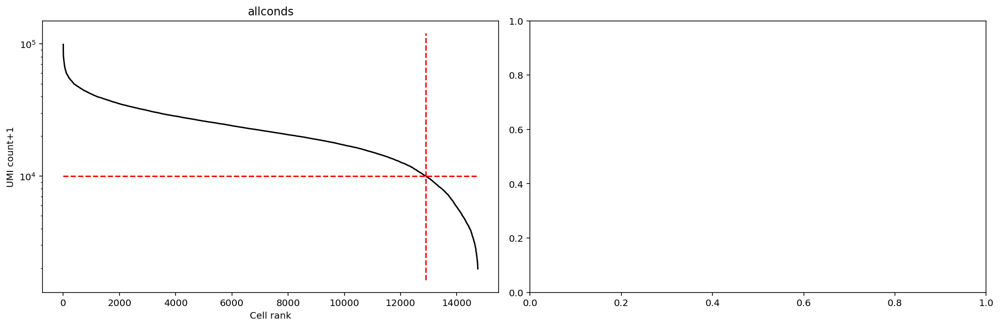

In [36]:
cf = []
thr_lb = [1e4]*len(dataset_meta)*2

fig1,ax1 = plt.subplots(1,len(dataset_meta)*2,figsize=(15,5))

for k in range(len(dataset_meta)):
    filename = loom_filepaths[len(subcluster_names)*k]
    dataset_name = raw_data_locations[len(subcluster_names)*k]
    
    with lp.connect(filename,mode='r') as ds:
        S = ds.layers[spliced_layer][:]
        U = ds.layers[unspliced_layer][:]
        gene_names = ds.ra[gene_attr]
        bcs = ds.ca[cell_attr]
        n_cells = S.shape[1]
        monod.preprocess.knee_plot(S+U,ax1[k],viz=True,thr=thr_lb[k])
        cf_ = ((S+U).sum(0)>thr_lb[k])
        
        n_annot_bcs = meta['cell_barcode'].sum()
        annot_bcs_in_loom = meta['cell_barcode'].isin(bcs).sum()
        annot_bcs_in_filt_loom = meta['cell_barcode'].isin(bcs[cf_]).sum()
        print(f'Dataset {dataset_name}. \n\t{len(bcs)} barcodes in loom, {cf_.sum()} pass filter. {n_annot_bcs} in annotations; of these, {annot_bcs_in_loom} in loom and {annot_bcs_in_filt_loom} in filtered loom.')
        
        #if k==0:
        for subcluster in subcluster_names:
            annot_bcs = meta[(meta['identity'].isin(subcluster))]['cell_barcode']
            cf.append(np.isin(bcs,annot_bcs) & cf_)
            print(f'\t{subcluster}: {len(annot_bcs)} cells in annotations. {np.isin(bcs,annot_bcs).sum()} in loom. {cf[-1].sum()} pass filter.')



    ax1[k].set_title(dataset_name)
    
!mkdir ./figs    
fig_dir = './figs/'
fig_string = fig_dir + 'kneeplots_all_germ.png'
fig1.tight_layout()
plt.savefig(fig_string,dpi=450)

In [37]:
print("Cells per subcluster: ", [x.sum() for x in cf])

Cells per subcluster:  [286, 178, 823, 345, 1505, 332, 1905, 1223, 249, 204, 1014, 1352, 91, 362, 4, 49, 7, 10, 1470, 1488]


In [38]:
#Conditions with too few cells after filtering
ok = []
okinds = []
for i in range(len(subcluster_names)):
    x = cf[i]
    if x.sum() > 50:
        ok += [subcluster_names[i]]
        okinds += [i]
print(len(ok))

16


In [39]:
ok

[['170313_O_E16'],
 ['170313_T_E16'],
 ['170712_O_E16'],
 ['170712_T_E16'],
 ['170724_O_E12'],
 ['170724_T_E12'],
 ['170726_T_E13'],
 ['170802_T_E13'],
 ['170814_AGPF_E11'],
 ['170814_AGPM_E11'],
 ['170816_O_E12'],
 ['170816_T_E12'],
 ['170823_AGPF_E11'],
 ['170823_AGPM_E11'],
 ['180222_O_E13'],
 ['180410_O_E13']]

In [40]:
ok = [['170313_O_E16'],['170802_T_E13'],
 ['180222_O_E13'],
 ['180410_O_E13']]


In [44]:
np.array(subcluster_names)[okinds]

array([['170313_O_E16'],
       ['170802_T_E13'],
       ['180222_O_E13'],
       ['180410_O_E13']], dtype='<U15')

In [42]:
okinds = [0,7,18,19]

In [45]:
dataset_meta = ['allconds']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [i for i in ok]

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['germ_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200524_mouse_genome_polyA_cum_1'

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/germcell_splicing/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

cf = np.array(cf)[okinds]

dataset_meta:  ['allconds']

dataset_names:  ['germ_allconds_170313_O_E16', 'germ_allconds_170802_T_E13', 'germ_allconds_180222_O_E13', 'germ_allconds_180410_O_E13']
len(dataset_names):  4

loom_filepaths:  ['/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom']


In [46]:
cf = list(cf)

## **Gene Filtering**

In [47]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

In [19]:
!mkdir ./fits

mkdir: cannot create directory ‘./fits’: File exists


INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1 created.
INFO:root:Dataset: germ_allconds_170313_O_E16
INFO:root:286 cells detected.
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:1645 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_O_E16 created.
INFO:root:Dataset: germ_allconds_170313_T_E16
INFO:root:178 cells detected.
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:1403 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16 created.
INFO:root:Dataset: germ_allconds_170712_O_E16
INFO:root:823 cells detected.
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:1461 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_a

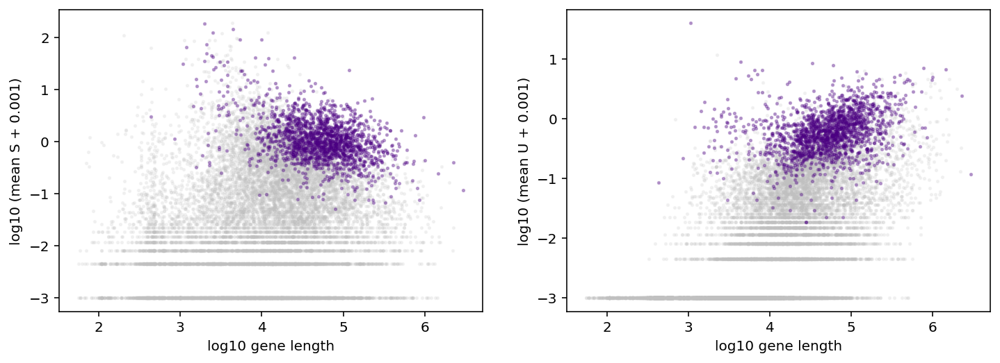

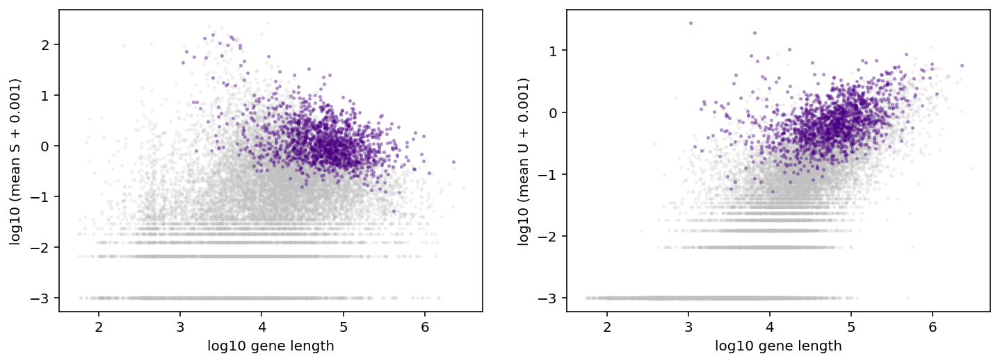

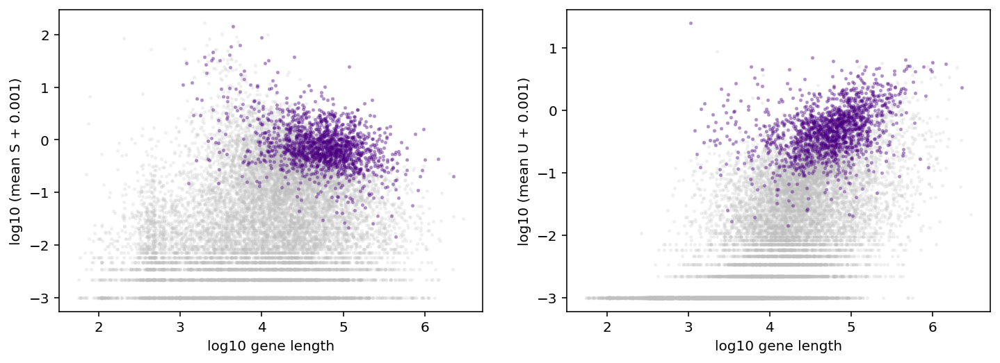

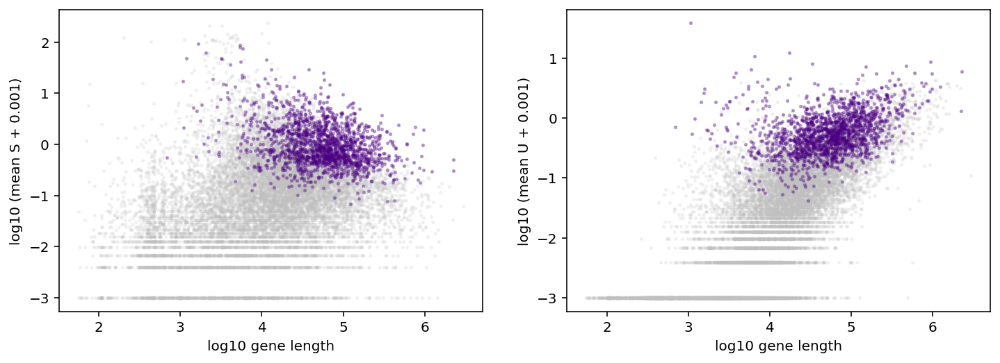

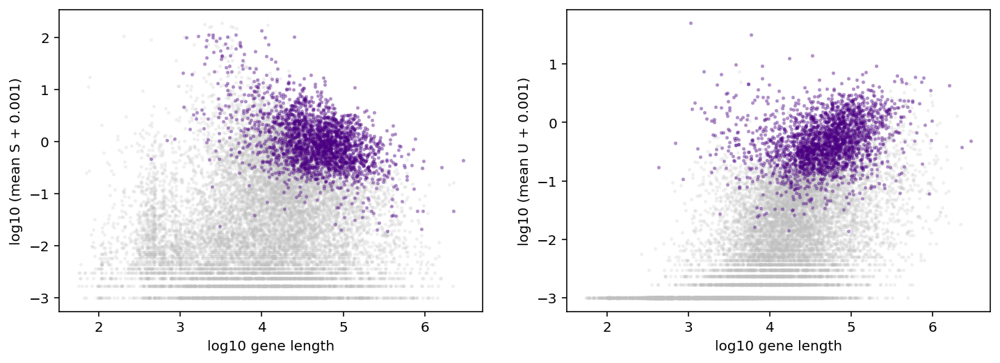

...

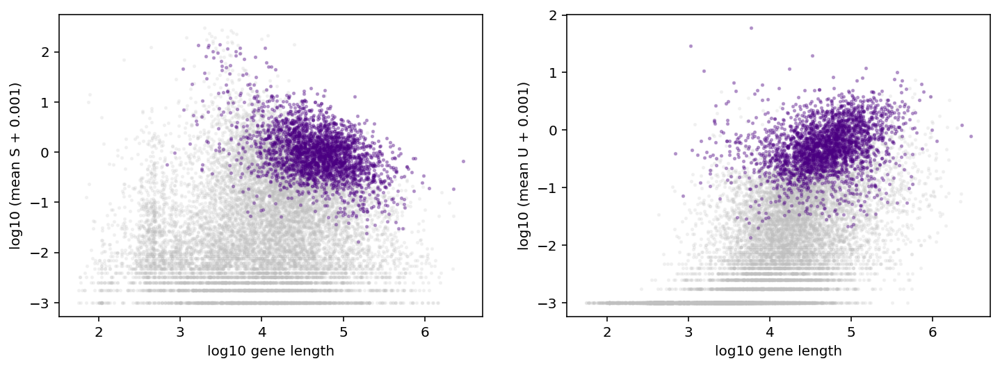

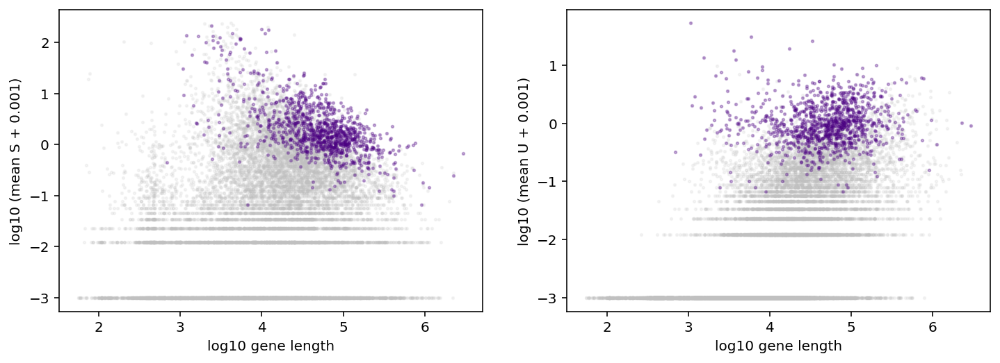

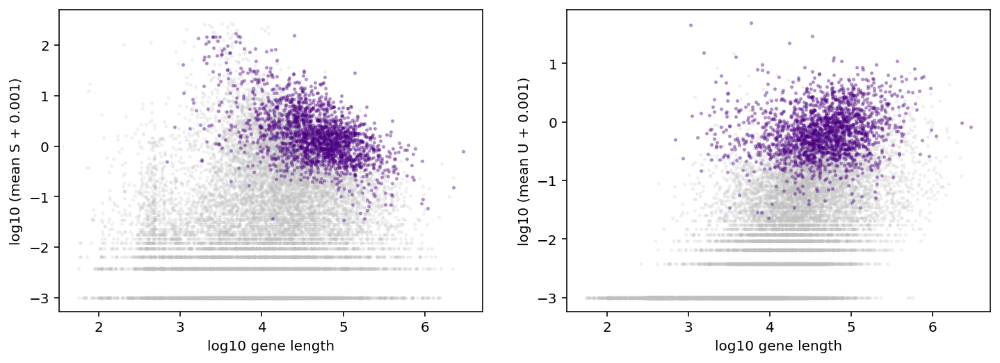

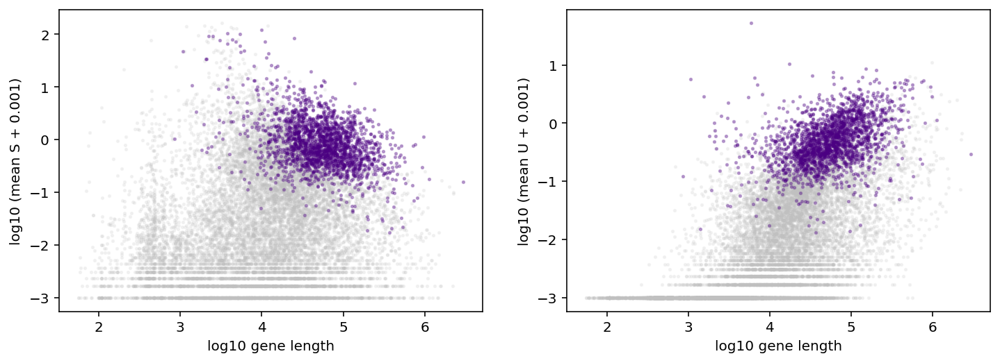

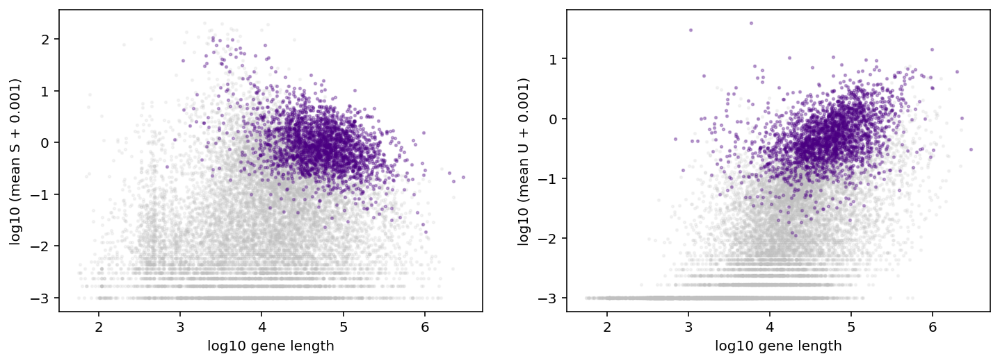

In [76]:
#Set certain genes?
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='germ_all',batch_id=1,\
                                             n_genes=3000,exp_filter_threshold=None,cf=cf)

In [48]:
dir_string = './fits/gg_230303_025_germ_all_1'

In [49]:
dataset_strings = [ dir_string+'/'+item for item in os.listdir(dir_string) if os.path.isdir(os.path.join(dir_string, item)) ]


In [50]:
print(dataset_strings[0])
print(len(dataset_strings))

./fits/gg_230303_025_germ_all_1/germ_allconds_170726_T_E13
17


In [51]:
dataset_strings = [i for i in dataset_strings if 'diagnostic_figures' not in i ]
print(len(dataset_strings))

16


In [53]:
dataset_strings = list(np.array(dataset_strings)[[1,14,7,9]])
dataset_strings

['./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16',
 './fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13',
 './fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13',
 './fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13']

## **Inference**

In [54]:
#Define bounds
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [20,21]

In [55]:
print(len(dataset_strings))

4


INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21 already exists.
INFO:root:Global inference parameters stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170313_O_E16
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230303_025_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [3:27:31<00:00, 29.65s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures already exists.
INFO:root:Runtime: 12453.7 seconds.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170802_T_E13
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230303_025_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:Starting parallelized gr

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [5:12:10<00:00, 44.60s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 18732.8 seconds.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_180222_O_E13
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230303_025_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/raw.sd.
INFO:root:Starting parallelized grid scan

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [4:02:43<00:00, 34.67s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 14565.3 seconds.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21 created.
INFO:root:Global inference parameters stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_180410_O_E13
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230303_025_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/raw.sd.
INFO:root:Starting parallelized grid scan

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 420/420 [4:33:40<00:00, 39.10s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures created.
INFO:root:Runtime: 16422.3 seconds.


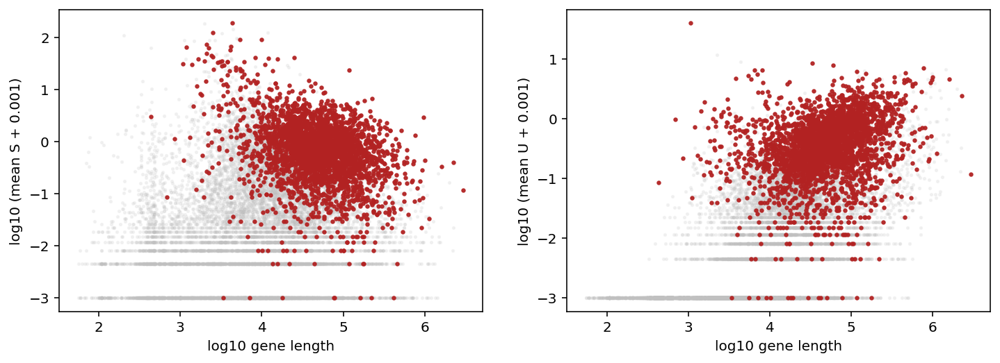

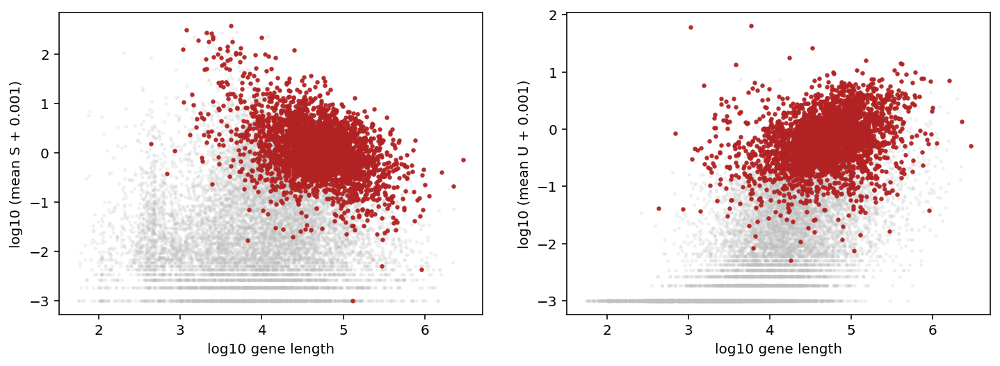

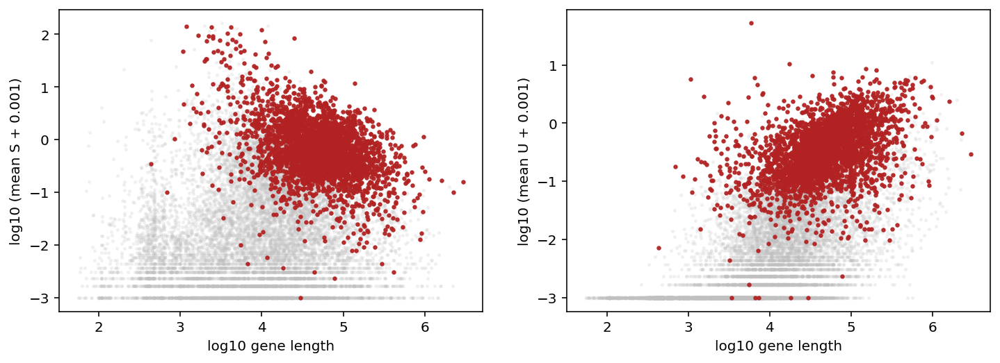

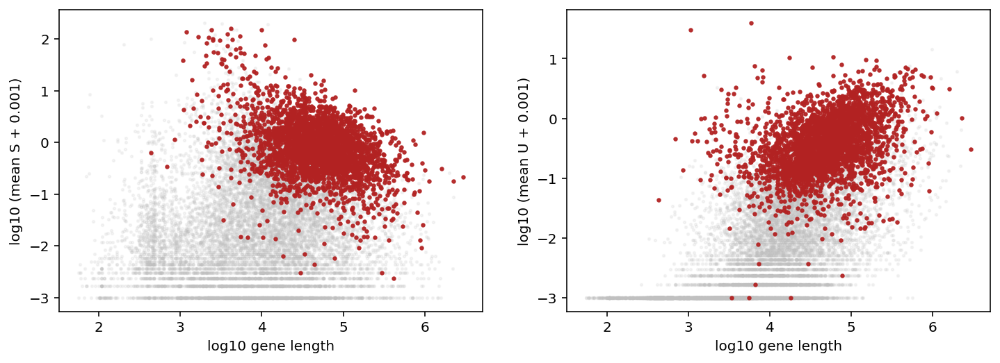

In [56]:
result_strings = []
for i in range(n_datasets):
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':5})
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, dataset_attr_names=attribute_names,cf=cf[i])
    full_result_string = inference_parameters.fit_all_grid_points(60,search_data)

    result_strings.append(full_result_string)

In [60]:
result_strings = [i+'/Bursty_Poisson_20x21/grid_scan_results.res' for i in dataset_strings]
print(result_strings[0])

./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/grid_scan_results.res


## **QC and Analysis of Results**

In [58]:
n_datasets

4

INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_O_E16/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 1868 genes out of 3000. Runtime: 4.3 seconds.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -6.37, -0.97.
INFO:root:Chi-square computation complete. Rejected 1868 genes out of 3000. Runtime: 4.2 seconds.
INFO:root:New optimum: -6.37, -0.97.


INFO:root:Gene 143 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 144 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 145 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 146 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 149 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 151 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 152 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 156 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 157 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 158 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 159 g

INFO:root:Gene 294 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 299 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 303 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 305 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 306 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 314 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 316 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 317 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 318 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 320 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 321 g

INFO:root:Gene 463 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 464 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 465 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 466 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 467 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 469 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 470 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 471 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 477 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 480 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 481 g

INFO:root:Gene 626 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 628 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 629 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 630 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 631 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 633 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 636 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 637 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 638 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 639 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 643 g

INFO:root:Gene 807 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 819 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 822 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 825 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 826 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 828 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 829 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 833 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 834 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 836 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 837 g

INFO:root:Gene 985 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 988 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 991 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 993 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 996 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 997 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 998 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1000 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1001 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1003 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 10

/home/ggorin/projects/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Gene 1159 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1160 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1165 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1168 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1170 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1171 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1172 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1175 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1178 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1179 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 1330 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1331 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1332 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1333 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1334 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1336 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1338 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1339 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1342 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1343 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 1483 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1486 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1491 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1492 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1493 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1497 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1498 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1499 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1500 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1501 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 1661 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1662 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1665 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1667 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1668 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1670 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1673 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1676 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1677 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1678 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 1834 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1836 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1842 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1843 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1844 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1848 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1850 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1852 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1858 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 1862 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 2015 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2019 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2022 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2024 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2026 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2028 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2031 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2034 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2035 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2036 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 2172 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2174 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2175 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2176 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2178 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2179 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2180 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2183 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2184 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2185 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 2336 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2338 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2340 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2341 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2346 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2349 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2354 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2355 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2358 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2359 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 2512 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2514 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2515 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2517 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2520 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2523 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2529 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2530 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2531 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2532 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 2697 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2700 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2702 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2703 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2704 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2707 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2708 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2712 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2714 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2719 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

INFO:root:Gene 2848 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2850 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2854 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2855 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2857 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2860 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2862 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2864 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2865 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:Gene 2866 gives negative stdev; replaced with mean. (Search converged to local minimum?)
INFO:root:

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/analysis_figures created.
INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 168 genes out of 3000. Runtime: 8.1 seconds.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_2

/home/ggorin/projects/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 69 genes out of 3000. Runtime: 6.2 seconds.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Burs

/home/ggorin/projects/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/analysis_figures already exists.
INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/grid_scan_results.res.
INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/raw.sd.
INFO:root:No rejection statistics have been computed.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures/kldiv.png.
INFO:root:Chi-square computation complete. Rejected 87 genes out of 3000. Runtime: 6.9 seconds.


/home/ggorin/projects/monod/src/monod/inference.py:1416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(nrows=Nsamp, ncols=Ntries, figsize=figsize)


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Original optimum: -6.37, -0.97.
INFO:root:Chi-square computation complete. Rejected 87 genes out of 3000. Runtime: 6.8 seconds.
INFO:root:New optimum: -6.37, -0.97.
INFO:root:Chi-square computation complete. Rejected 87 genes out of 3000. Runtime: 6.7 seconds.
INFO:root:New optimum: -6.37, -0.97.
INFO:root:Chi-square computation complete. Rejected 87 genes out of 3000. Runtime: 6.7 seconds.
INFO:root:New optimum: -6.37, -0.97.
INFO:root:Chi-square computation complete. Rejected 87 genes out of 3000. Runtime: 6.7 seconds.
INFO:root:New optimum: -6.37, -0.97.
INFO:root:Chi-square computation complete. Rejected 87 genes out of 3000. Runtime: 6.7 seconds.
INFO:root:Optimum retained at -6.37, -

/home/ggorin/projects/monod/src/monod/inference.py:1370: RuntimeWarning: invalid value encountered in sqrt
  sigma[gene_index, :] = np.sqrt(np.diag(hess_inv)) / np.sqrt(


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in double_scalars
  fac1 = a / np.pi * np.exp(gamma)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_continuous_distns.py:4154: RuntimeWarning: overflow encountered in exp
  fac1 = a / np.pi * np.exp(gamma)


INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures/parameter_marginals.png.
INFO:root:Directory ./fits/gg_230303_025_germ_all_1/analysis_figures already exists.


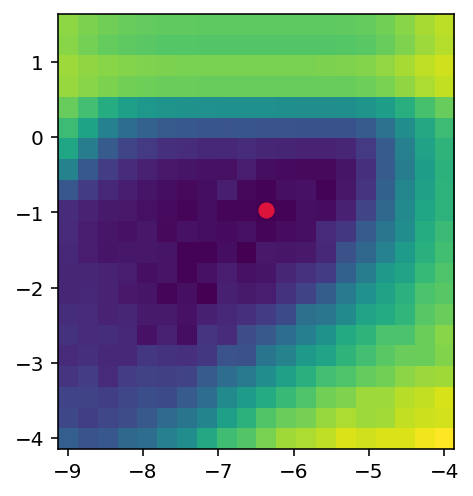

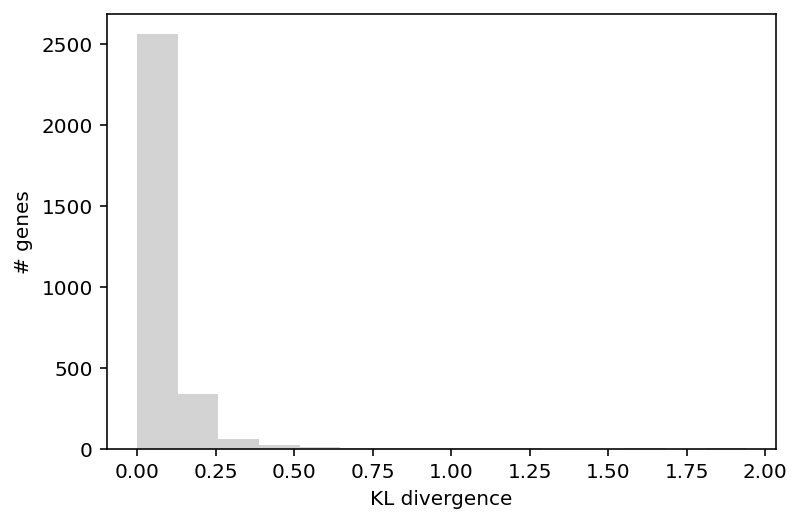

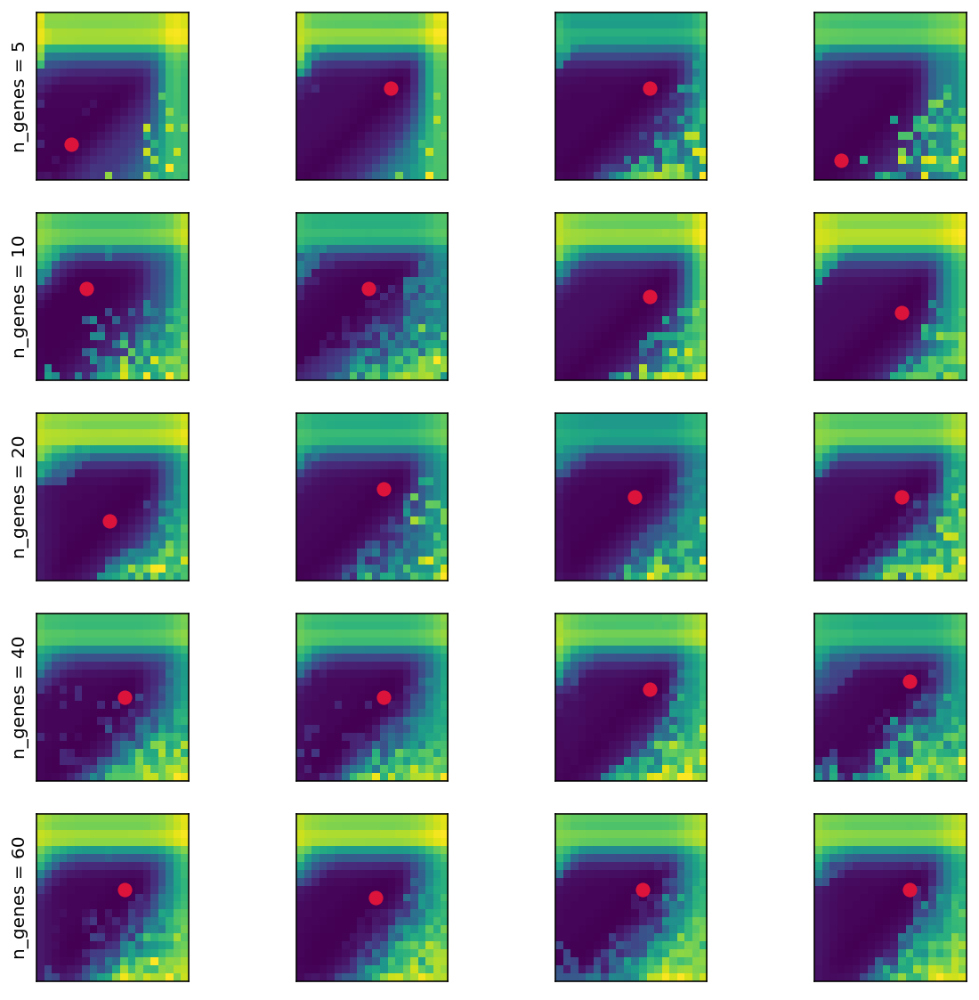

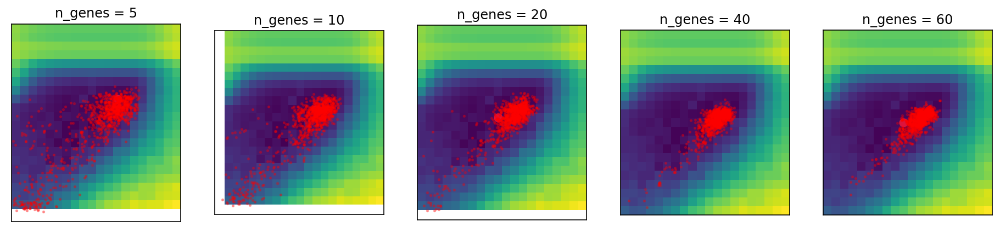

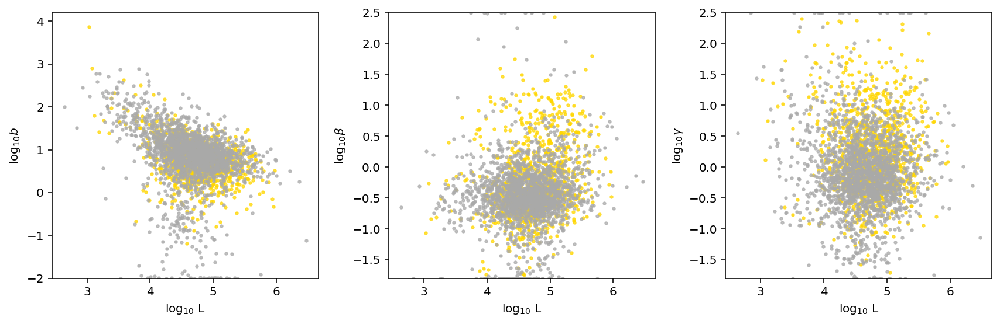

...

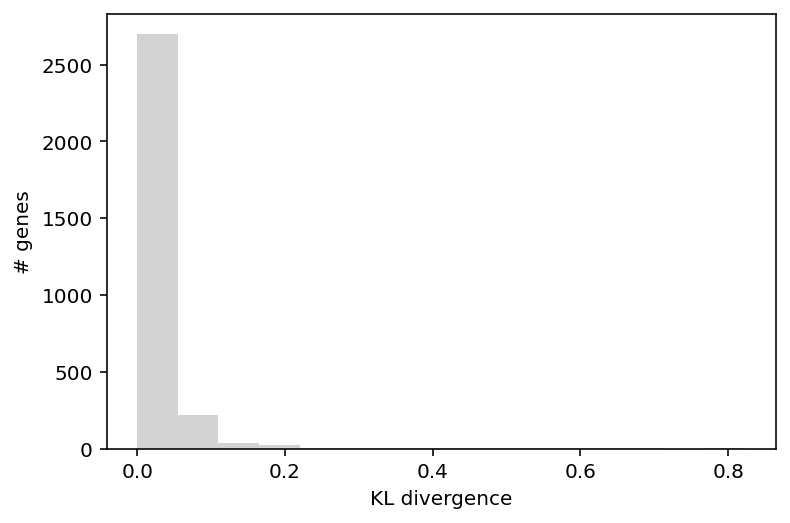

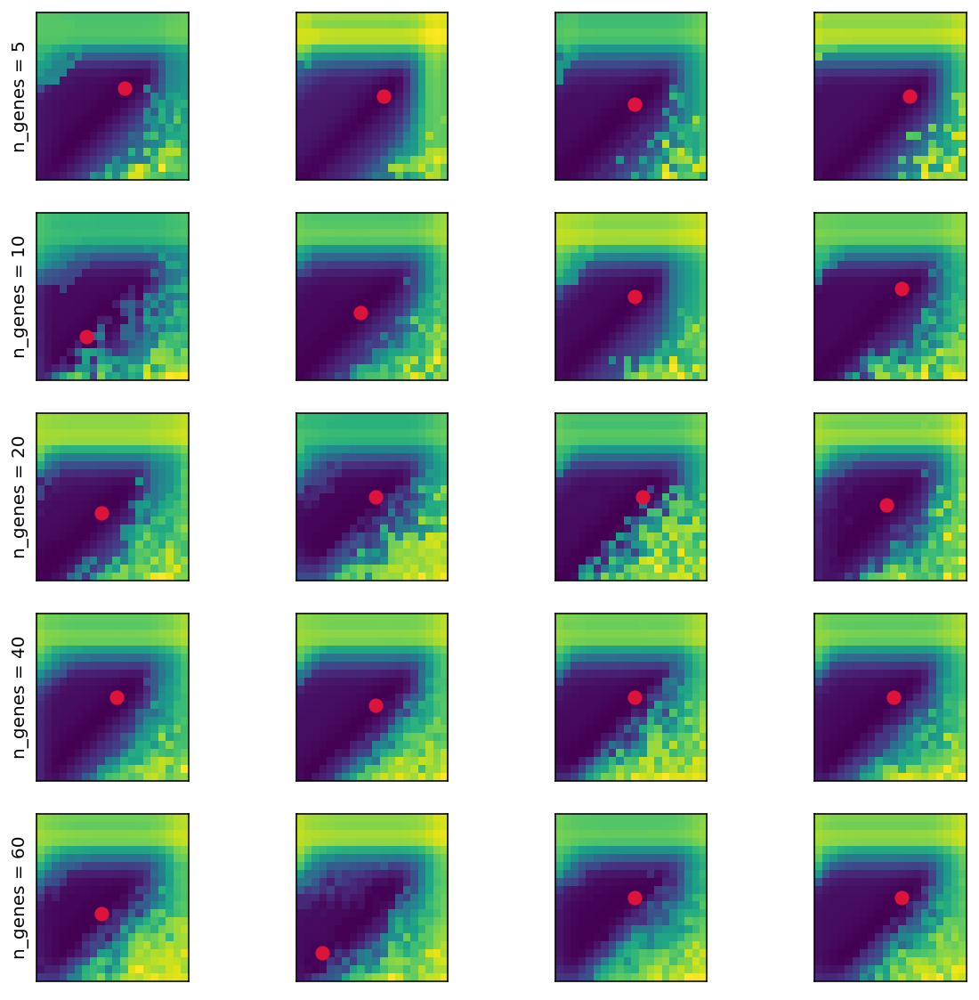

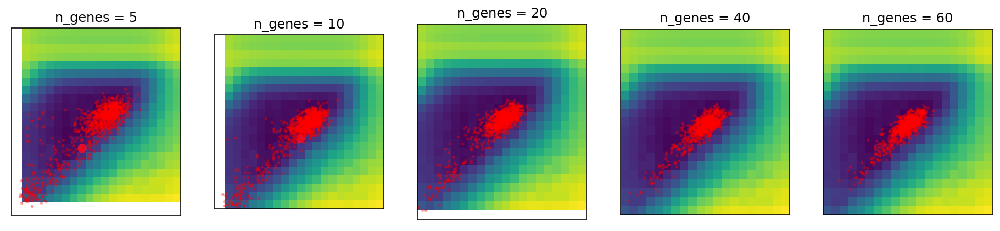

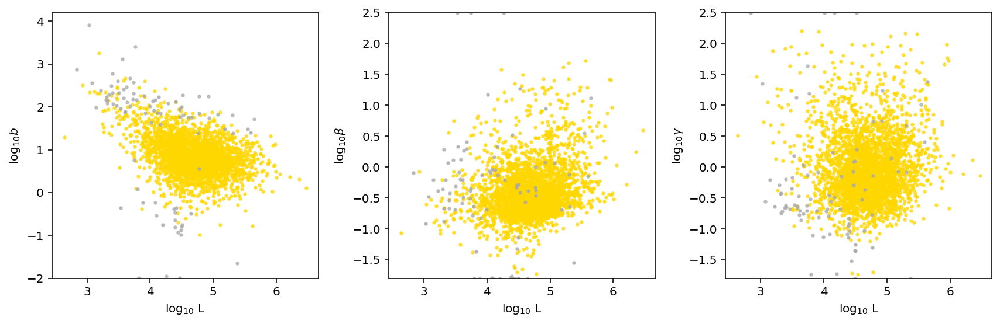

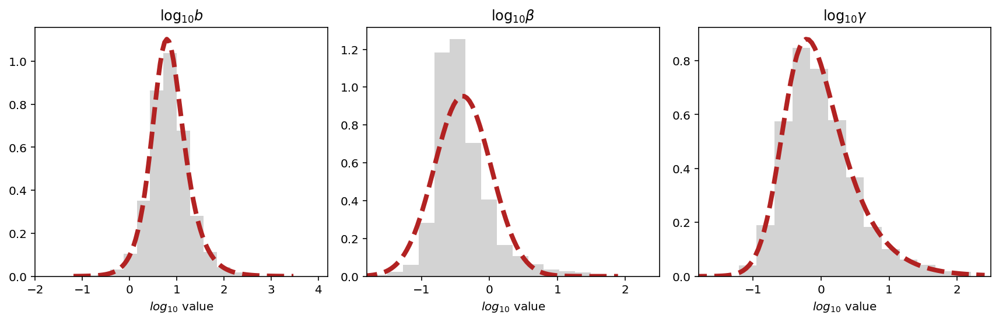

In [63]:
#Currently showing results for old run
for i in range(n_datasets):
    sr = monod.analysis.load_search_results(result_strings[i])
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.find_sampling_optimum()
    sr.plot_landscape(ax1)

    fig1,ax1 = plt.subplots(1,1)
    sr.plot_KL(ax1)

    #sr.plot_gene_distributions(sd,marg='joint') #Rerun fits, and try uncommenting

    _=sr.chisquare_testing(sd,threshold=1e-3)
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

    sr.compute_sigma(sd,num_cores=60)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
    sr.plot_param_marg()
    
    monod.analysis.make_batch_analysis_dir([sr],dir_string)
    sr.update_on_disk()
    

In [64]:
#Read back in data
sr_arr = [monod.analysis.load_search_results(r[:-4]+'_upd.res') for r in result_strings]

INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/grid_scan_results_upd.res.


In [65]:
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+dataset_names[i])
    print(str(i)+': '+str(sr.samp_optimum))
    print()

0: germ_allconds_170313_O_E16
0: (-6.368421052631579, -0.9749999999999996)

1: germ_allconds_170802_T_E13
1: (-6.105263157894737, -0.9749999999999996)

2: germ_allconds_180222_O_E13
2: (-6.894736842105264, -1.525)

3: germ_allconds_180410_O_E13
3: (-6.368421052631579, -0.9749999999999996)



(-6.368421052631579, -0.9749999999999996)
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-6.105263157894737, -0.9749999999999996)
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-6.894736842105264, -1.525)
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.
(-6.368421052631579, -0.9749999999999996)
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180410_O_E13/Bursty_Poisson_20x21/analysis_figures/length_dependence.png.


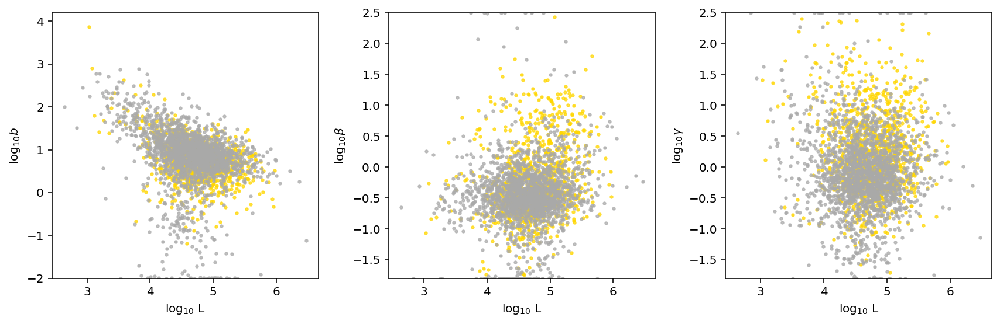

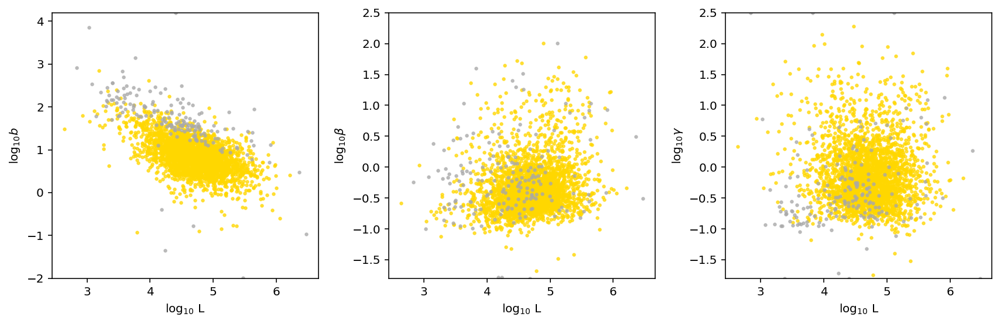

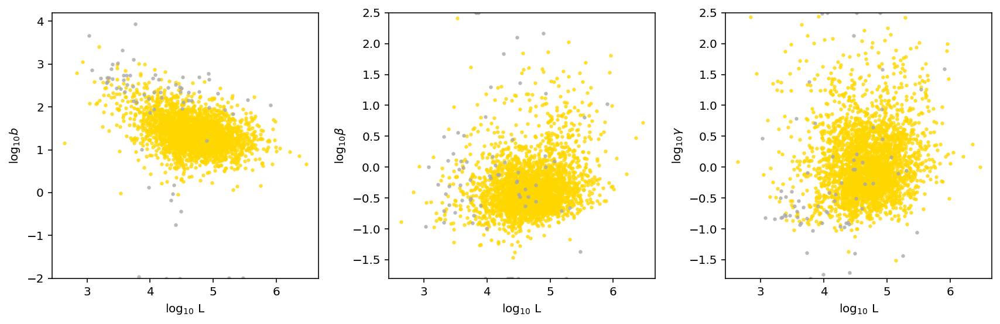

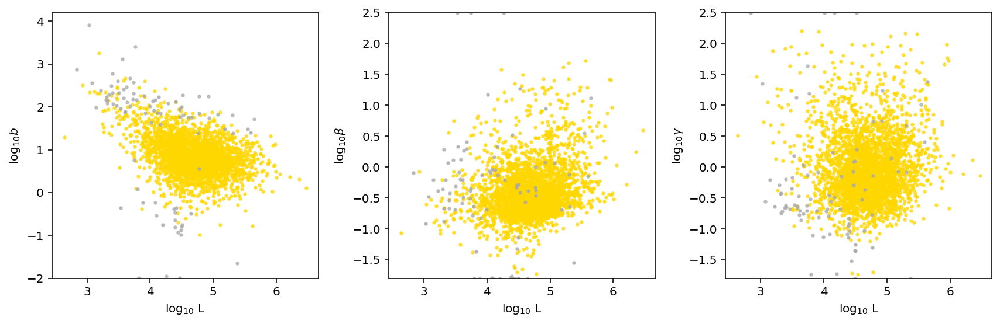

In [66]:
#See parameter fits per dataset
opt=[]
n_cells = []
for sr in sr_arr:
    y = sr.samp_optimum
    print(y)
    opt.append(y)
    n_cells.append(sr.n_cells)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
opt = np.asarray(opt)
n_cells = np.asarray(n_cells)

INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_O_E16/raw.sd.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/subsampling.png.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_20x21/analysis_figures/subsampling_stability.png.
INFO:root:Search data loaded from ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/raw.sd.
INFO:root:Figure stored to ./fits/gg_230303_025_germ_all_1/germ_allconds_180222_O_E13/Bursty_Poisson_20x21/analys

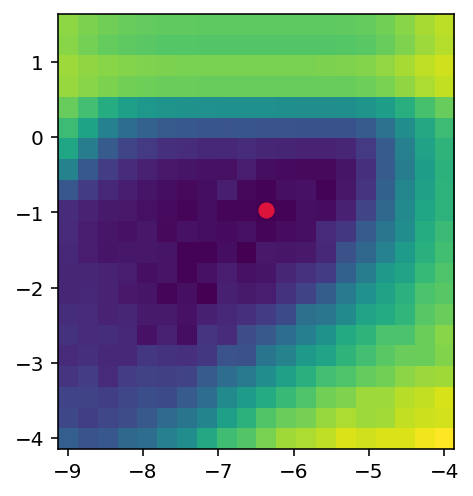

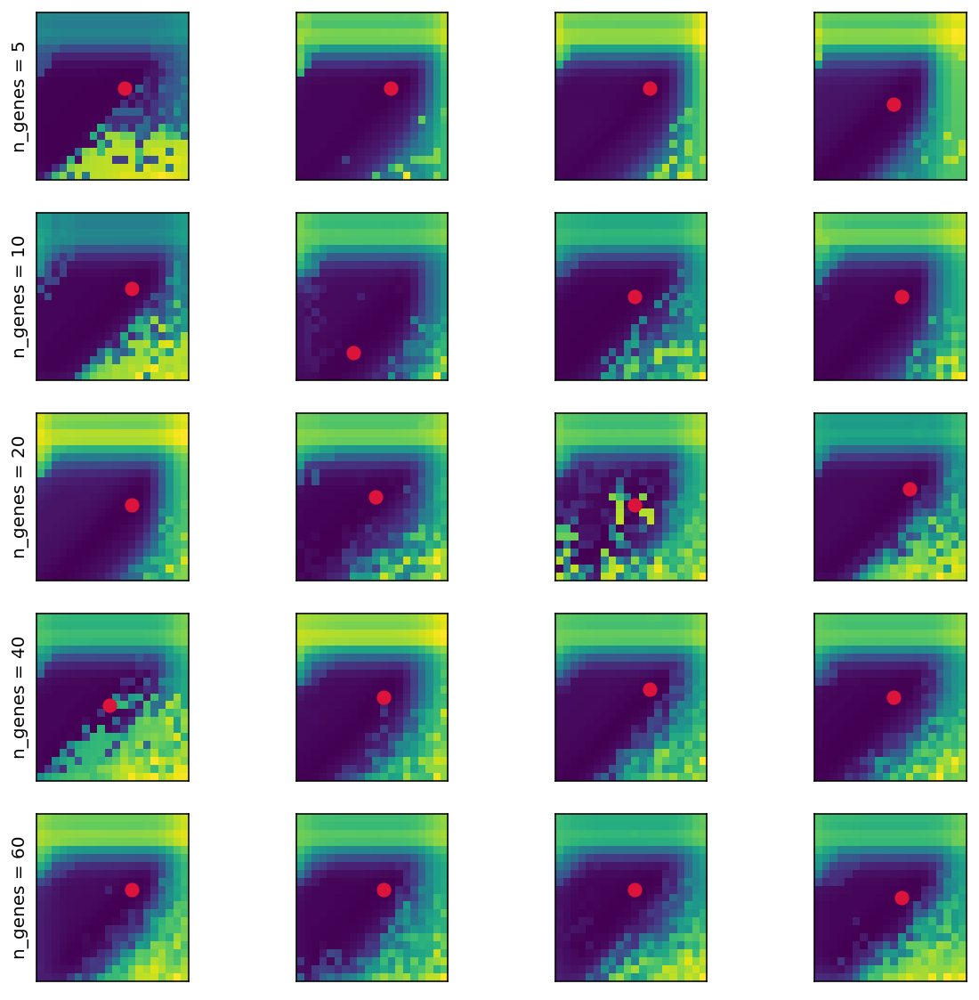

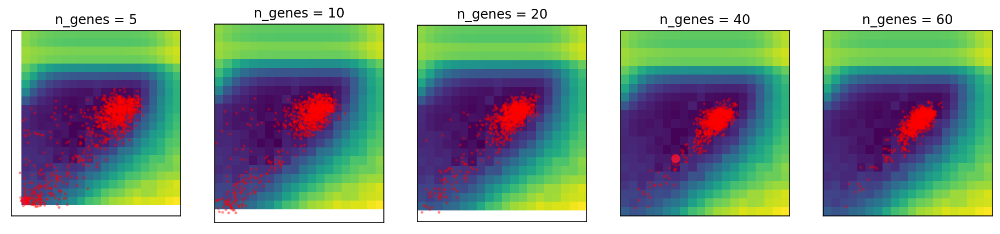

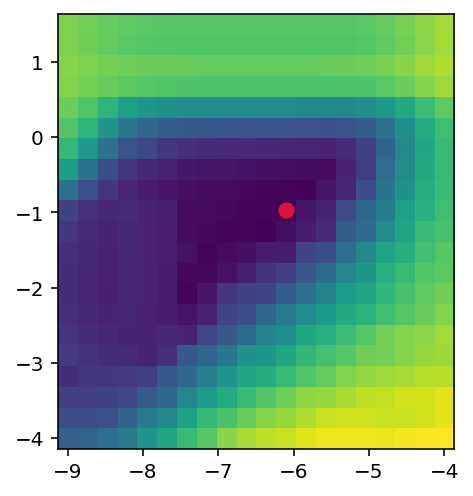

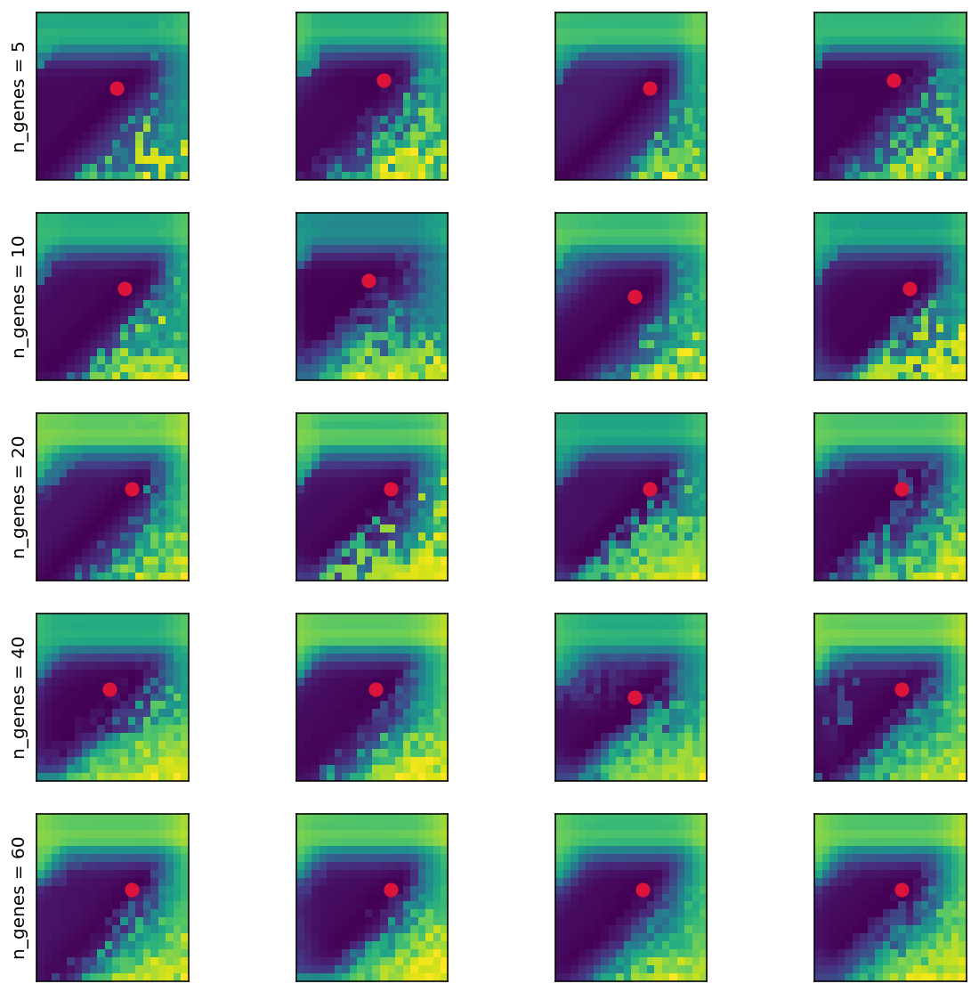

...

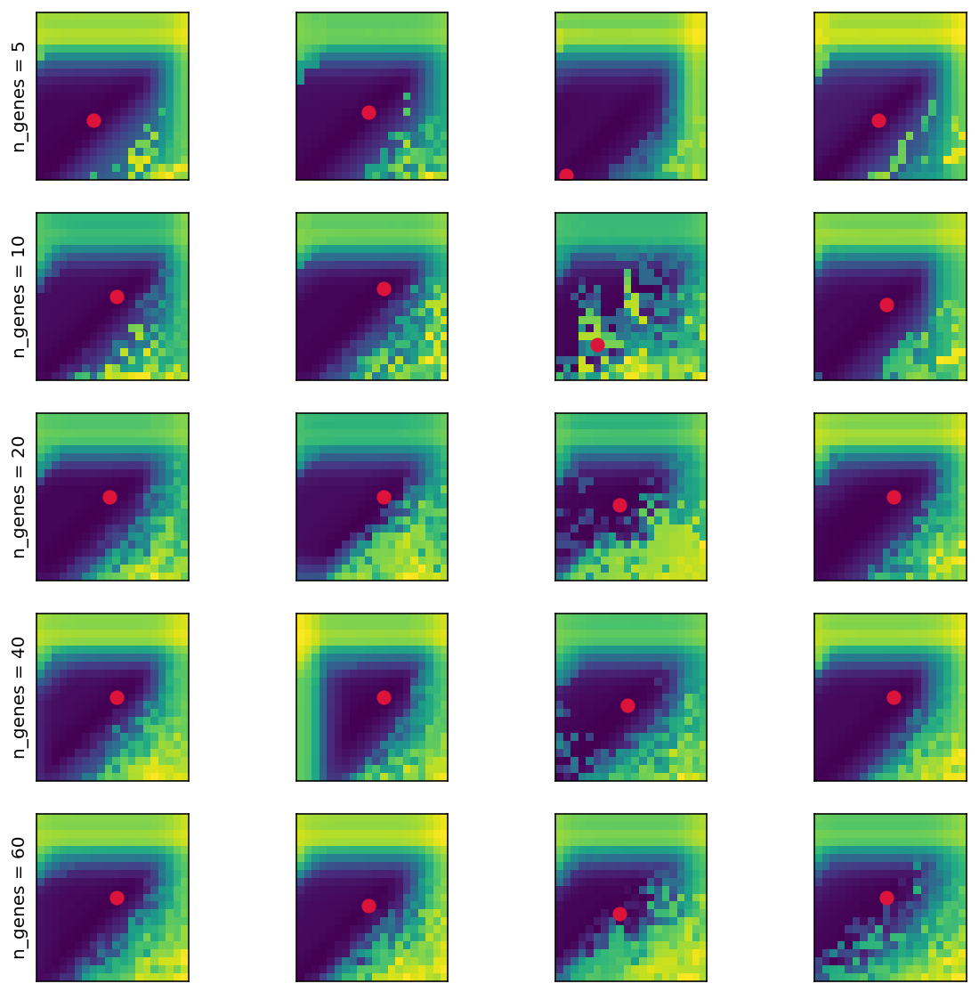

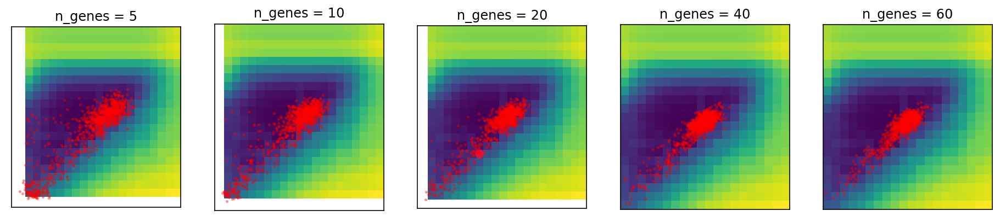

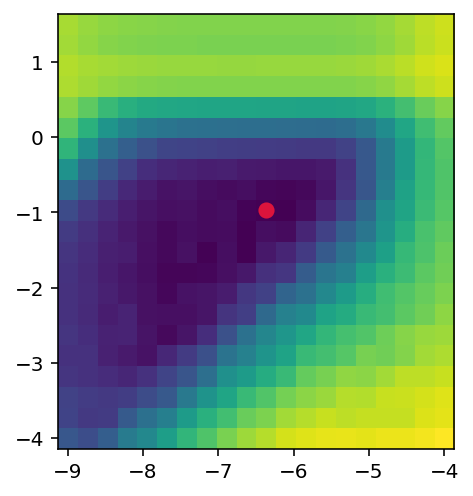

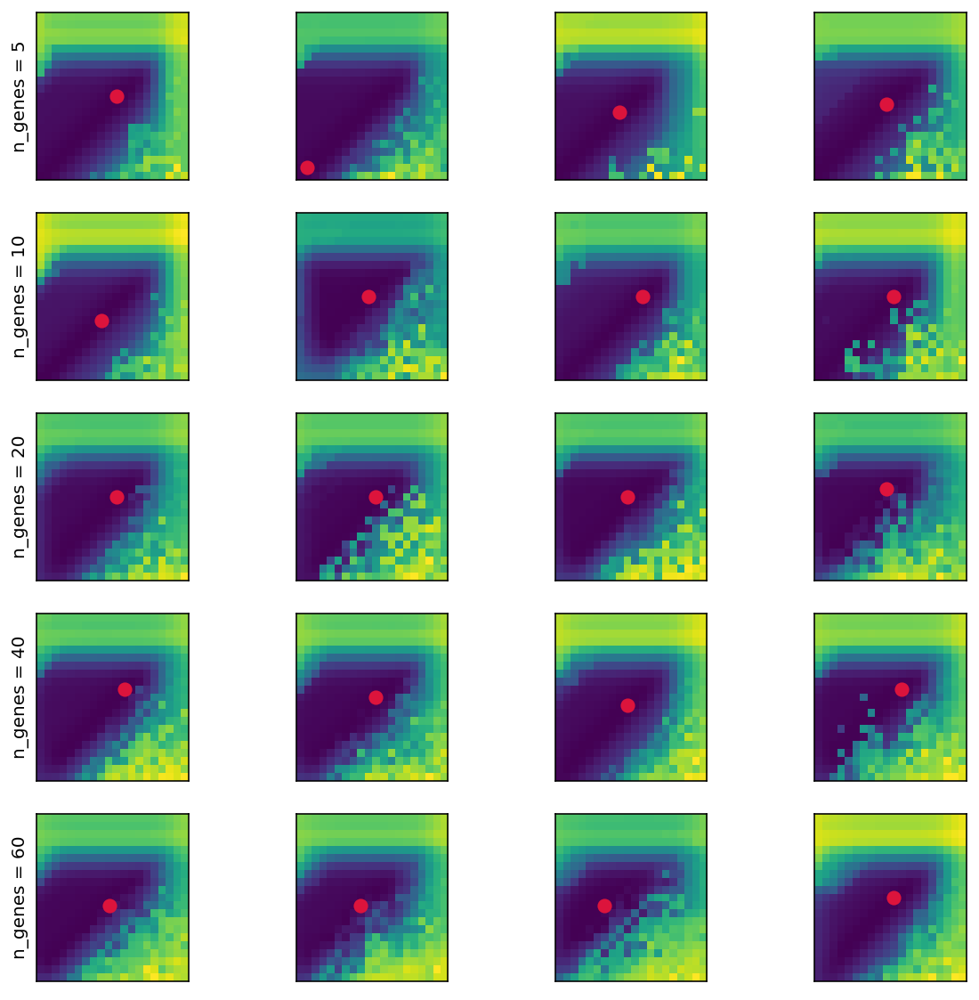

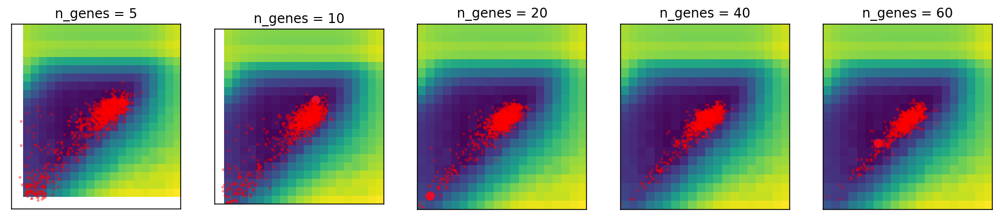

In [67]:
for i in range(len(dataset_names)):
    sr = sr_arr[i]
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.plot_landscape(ax1)
    
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    #sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

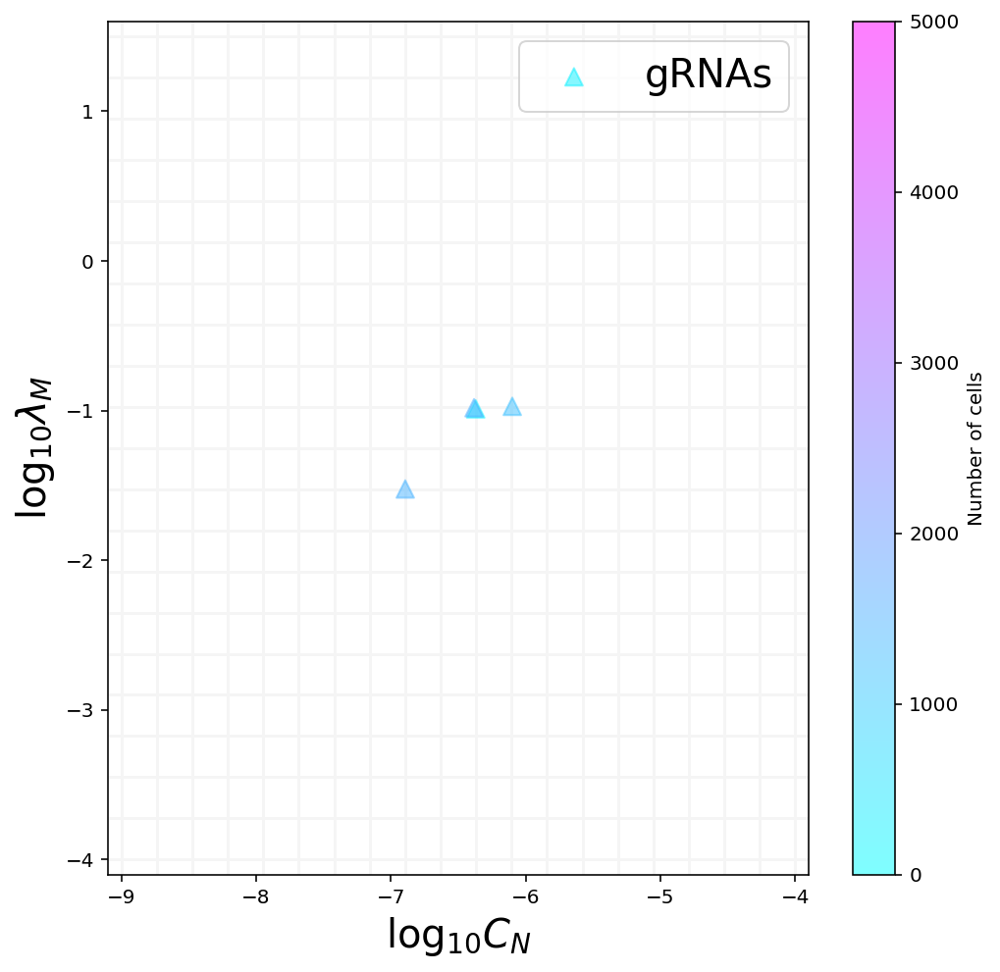

In [68]:
xl = np.asarray([sr.sp.samp_lb[0],sr.sp.samp_ub[0]])
yl = np.asarray([sr.sp.samp_lb[1],sr.sp.samp_ub[1]])
x=np.linspace(xl[0],xl[1],sr.sp.gridsize[0])
y=np.linspace(yl[0],yl[1],sr.sp.gridsize[1])

fs = 20
d=0.1

fig1,ax1 = plt.subplots(1,1,figsize=(8,8))
for i in range(sr.sp.gridsize[0]):
    plt.plot([x[i]]*2,yl + [-d,d],c='whitesmoke')
for i in range(sr.sp.gridsize[1]):
    plt.plot(xl+ [-d,d],[y[i]]*2,c='whitesmoke')
jit = np.random.randn(n_datasets,2)*0.01
opt_ = opt+jit
cmap = 'cool'

# ctf = range(6,n_datasets)
# plt.scatter(opt_[ctf,0],opt_[ctf,1],100,n_cells[ctf],zorder=1000,
#             alpha=0.3,cmap=cmap,label='Cell types',vmin=0,vmax=5000)

stf = range(n_datasets) #-1 to exclude combo control

plt.scatter(opt_[stf,0],opt_[stf,1],80,n_cells[stf],marker='^',zorder=1000,
            alpha=0.5,cmap=cmap,label='gRNAs',vmin=0,vmax=5000)
plt.xlim(xl+ [-d,d])
plt.ylim(yl+ [-d,d])

plt.legend(fontsize=fs,loc='upper right')
plt.colorbar(label='Number of cells')

plt.xlabel(r'$\log_{10} C_N$',fontsize=fs)
plt.ylabel(r'$\log_{10} \lambda_M$',fontsize=fs)

fig_string = sr.batch_analysis_string+'/landscape_qc.png'
plt.savefig(fig_string,dpi=450)

**Look at Ovary versus Testes**

Determine if there's bias in estimated parameters

In [85]:
# a e s t h e t i c s
from matplotlib.colors import ListedColormap

#all
col_gold = [203/255,197/255,149/255]
col_gray = [116/255,112/255,113/255]
col_red = [212/255,107/255,75/255]
col_b = ['#1B9AAA']
col_beta = ['#9fcbee']
col_gamma =['#3C50B1']
col_expr = ['#9299A0']

### SI figures
ms = 0.7
lw = ms
ms_fail = 1
alf = 0.3
alf_fail = 0.5
sifig_aesth = (ms,lw,ms_fail,alf,alf_fail)

### Body figures
ms = 2
lw = ms
ms_fail = 2
alf = 0.3
alf_fail = 0.8
msfig_aesth = (ms,lw,ms_fail,alf,alf_fail)

markerstyle = None

c_highlight = col_red
c1 = [173/255,214/255,200/255]
c2 = [59/255,131/255,130/255]
ncol=20
cmap = ListedColormap(np.array([np.linspace(c2[j],c1[j],ncol) for j in range(3)]).T)

In [69]:
#Do female vs male at each timepoint

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))

control = 3 #Last ovary E13

for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum #control params
    par_vals_uncorrected[1,j,:,:] = sr_arr[j].phys_optimum

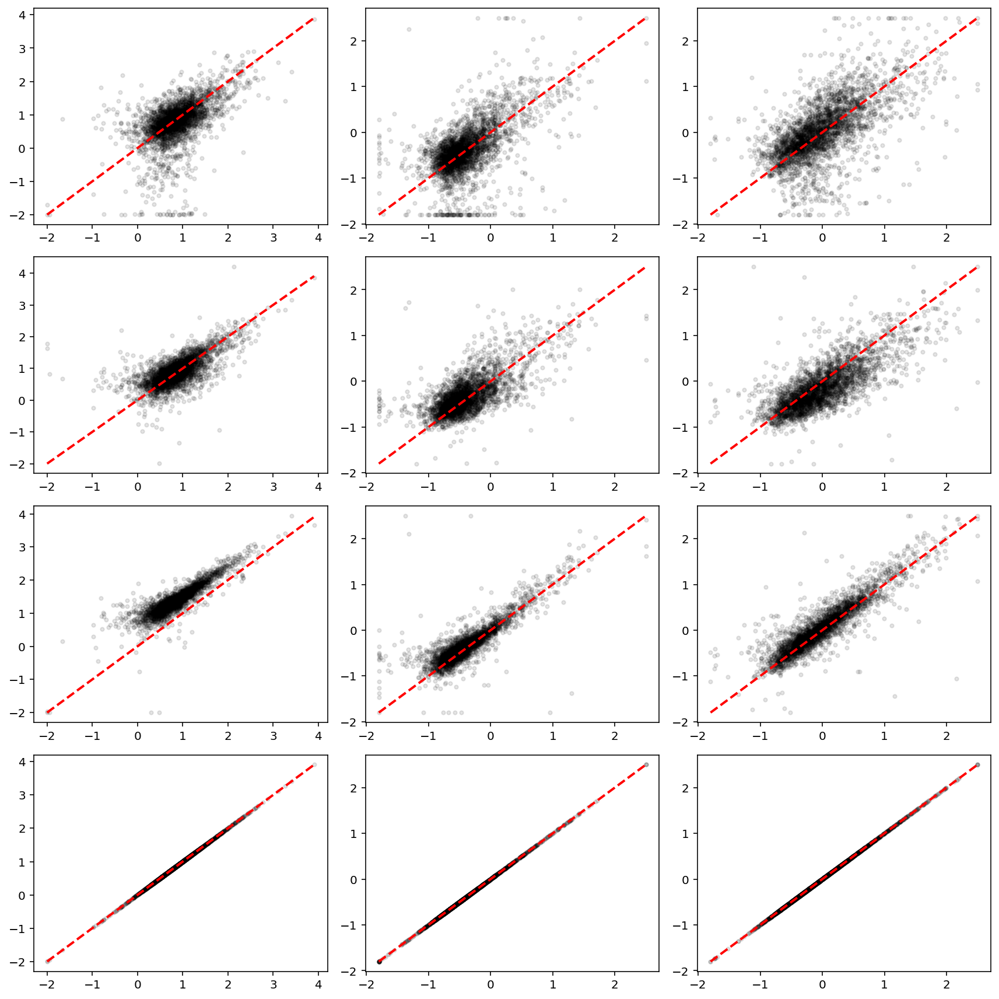

In [70]:
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(12,12))
for d in range(n_datasets):
    for k in range(n_phys_pars):
        x=par_vals_uncorrected[0,d,:,k]
        y=par_vals_uncorrected[1,d,:,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

In [71]:
#Compare 1 to 3 for now (T_E13 vs O_E13)

splice_genes = ['Bnc2', 'Dmrt1', 'Tet1', 'Ccnd3']  # beta_O/beta_T should be higher 

upreg_genes = ['Tbrg4', 'Rbm38', 'Supt6']



In [72]:
splice_filt = pd.Categorical(sr_arr[0].gene_names).isin(splice_genes)

In [102]:
upreg_filt = pd.Categorical(sr_arr[0].gene_names).isin(upreg_genes)

In [73]:
#For the genes, get b beta and gamma ratios
ind1 = 3 #Ovary
ind2 = 1 #Testes

ovary = par_vals_uncorrected[0,ind2,splice_filt,:]
testes = par_vals_uncorrected[1,ind2,splice_filt,:]

In [74]:
ovary.shape

(3, 3)

In [82]:
res = pd.DataFrame()
fcs = []

fcs = list(ovary[:,0] - testes[:,0] )
fcs += list(ovary[:,1] - testes[:,1] )
fcs += list(ovary[:,2] - testes[:,2] )

res['FC'] = np.log2(10**np.array(fcs))
res['Param'] = ['b']*np.sum(splice_filt)+['beta']*np.sum(splice_filt)+['gamma']*np.sum(splice_filt)
res['gene'] = list(sr_arr[0].gene_names[splice_filt])*3
res.head()

,FC,Param,gene
0,0.500954,b,Ccnd3
1,-0.317198,b,Dmrt1
2,-1.542189,b,Bnc2
3,3.045192,beta,Ccnd3
4,1.737930,beta,Dmrt1


<AxesSubplot:xlabel='gene', ylabel='FC'>

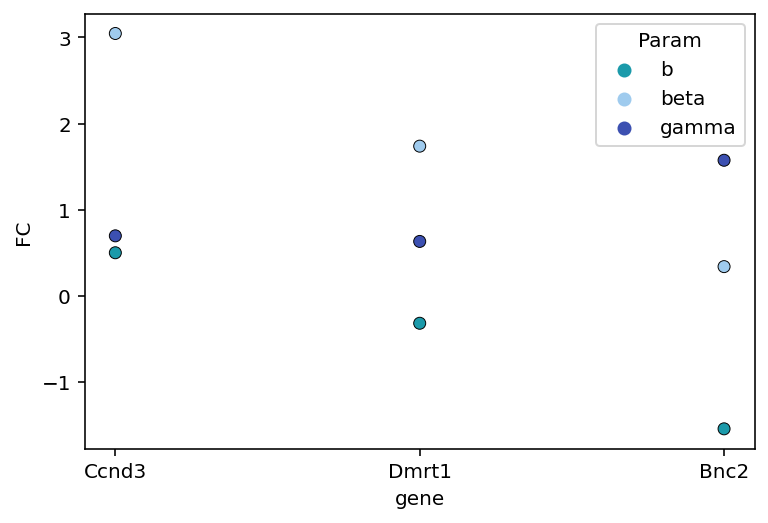

In [87]:
palette={'b':col_b[0],'beta':col_beta[0],'gamma':col_gamma[0],'expr':col_expr[0]}
sns.scatterplot(data=res,x='gene',y='FC',hue='Param',palette=palette,edgecolor='black')

In [94]:
#TRy correcting offset
param_names = sr_arr[0].model.get_log_name_str()
offsets = []
par_vals = np.copy(par_vals_uncorrected)
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[0,0,:,k]
    for j in range(n_datasets):
        m2 = par_vals_uncorrected[1,j,:,k]
        offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
        par_vals[1,j,:,k] -= offset

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1870: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/ggorin/projects/monod/src/monod/analysis.py:724: RuntimeWarning: invalid value encountered in true_divide
  z = (resid - fitparams[0]) / fitparams[1]


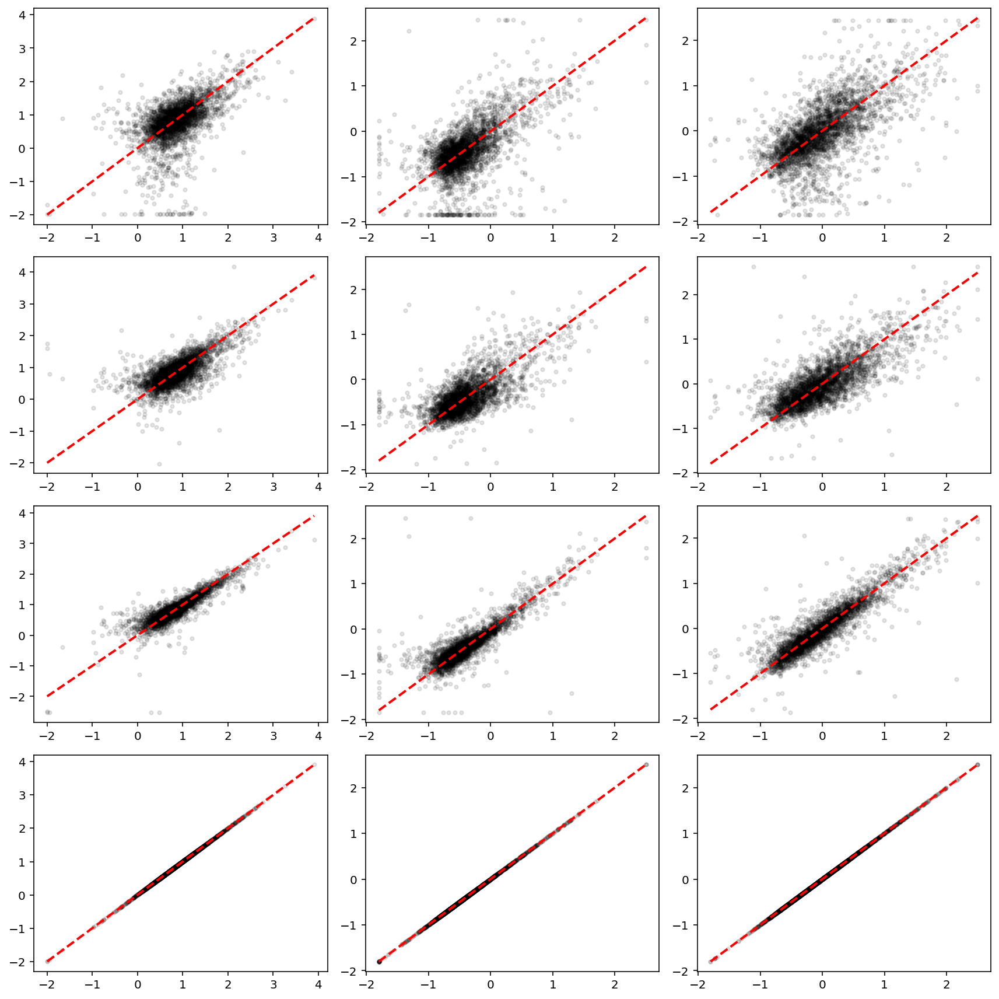

In [95]:
#Inspect
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(12,12))
for d in range(n_datasets):
    for k in range(n_phys_pars):
        x=par_vals[0,d,:,k]
        y=par_vals[1,d,:,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

In [100]:
#For the genes, get b beta and gamma ratios
ind1 = 3 #Ovary
ind2 = 1 #Testes

ovary = par_vals[0,ind2,splice_filt,:]
testes = par_vals[1,ind2,splice_filt,:]

res = pd.DataFrame()
fcs = []

fcs = list(ovary[:,0] - testes[:,0] )
fcs += list(ovary[:,1] - testes[:,1] )
fcs += list(ovary[:,2] - testes[:,2] )

res['FC'] = np.log2(10**np.array(fcs))
res['Param'] = ['b']*np.sum(splice_filt)+['beta']*np.sum(splice_filt)+['gamma']*np.sum(splice_filt)
res['gene'] = list(sr_arr[0].gene_names[splice_filt])*3
res.head()

,FC,Param,gene
0,0.609696,b,Ccnd3
1,-0.208456,b,Dmrt1
2,-1.433447,b,Bnc2
3,3.262174,beta,Ccnd3
4,1.954912,beta,Dmrt1


Text(0, 0.5, 'ovary/testes FC')

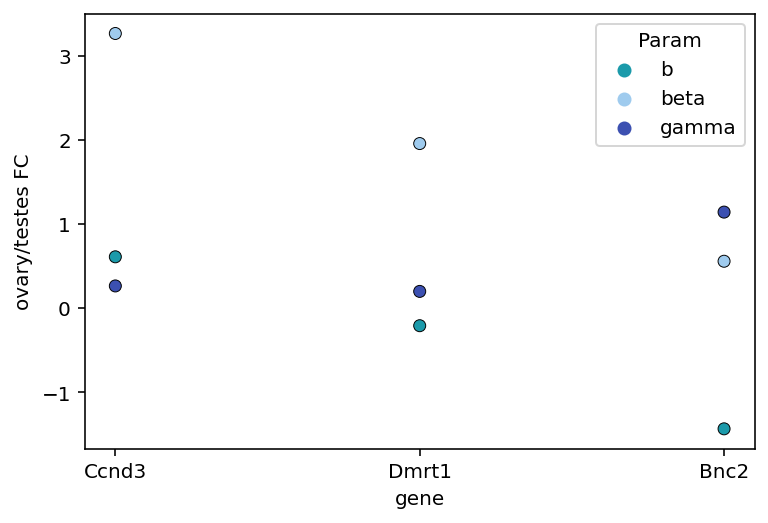

In [103]:
palette={'b':col_b[0],'beta':col_beta[0],'gamma':col_gamma[0],'expr':col_expr[0]}
sns.scatterplot(data=res,x='gene',y='FC',hue='Param',palette=palette,edgecolor='black')
plt.ylabel('ovary/testes FC')

In [104]:
#Upregulated genes (in testes)
ind1 = 3 #Ovary
ind2 = 1 #Testes

ovary = par_vals[0,ind2,upreg_filt,:]
testes = par_vals[1,ind2,upreg_filt,:]

res = pd.DataFrame()
fcs = []

fcs = list( testes[:,0]-ovary[:,0] )
fcs += list(testes[:,1]-ovary[:,1] )
fcs += list(testes[:,2]-ovary[:,2] )

res['FC'] = np.log2(10**np.array(fcs))
res['Param'] = ['b']*np.sum(upreg_filt)+['beta']*np.sum(upreg_filt)+['gamma']*np.sum(upreg_filt)
res['gene'] = list(sr_arr[0].gene_names[upreg_filt])*3
res.head()

,FC,Param,gene
0,-0.824641,b,Tbrg4
1,1.847700,b,Supt6
2,-1.262898,beta,Tbrg4
3,-0.398280,beta,Supt6
4,-1.867305,gamma,Tbrg4


Text(0, 0.5, 'testes/ovary FC')

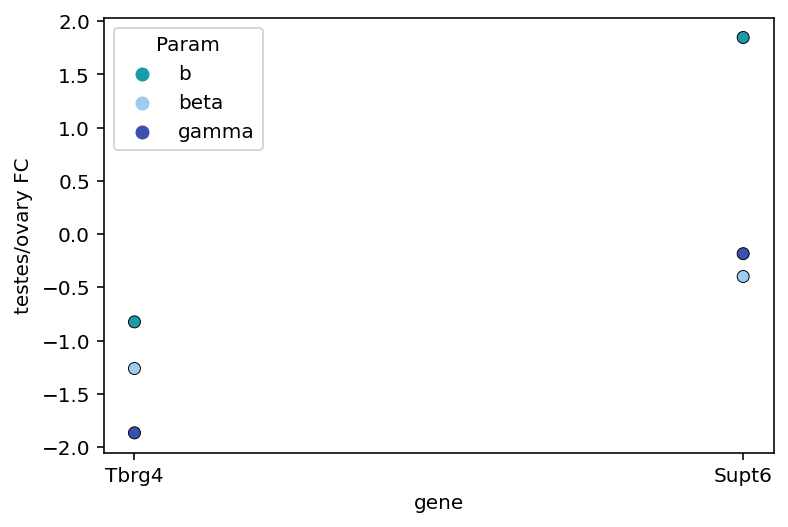

In [105]:
palette={'b':col_b[0],'beta':col_beta[0],'gamma':col_gamma[0],'expr':col_expr[0]}
sns.scatterplot(data=res,x='gene',y='FC',hue='Param',palette=palette,edgecolor='black')
plt.ylabel('testes/ovary FC')

In [111]:
others = ['Nanos2', 'Dnmt3l' ,'Piwil4', 'Pou5f1']
others_filt = pd.Categorical(sr_arr[0].gene_names).isin(others)
np.sum(others_filt)

0

Text(0, 0.5, 'testes/ovary FC')

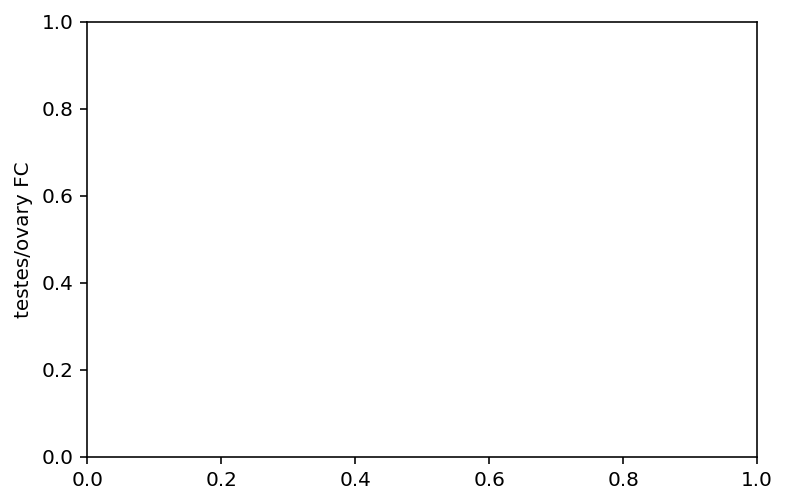

In [110]:
#Upregulated genes (in testes)
ind1 = 3 #Ovary
ind2 = 1 #Testes

ovary = par_vals[0,ind2,others_filt,:]
testes = par_vals[1,ind2,others_filt,:]

res = pd.DataFrame()
fcs = []

fcs = list( testes[:,0]-ovary[:,0] )
fcs += list(testes[:,1]-ovary[:,1] )
fcs += list(testes[:,2]-ovary[:,2] )

res['FC'] = np.log2(10**np.array(fcs))
res['Param'] = ['b']*np.sum(others_filt)+['beta']*np.sum(others_filt)+['gamma']*np.sum(others_filt)
res['gene'] = list(sr_arr[0].gene_names[others_filt])*3
res.head()


palette={'b':col_b[0],'beta':col_beta[0],'gamma':col_gamma[0],'expr':col_expr[0]}
sns.scatterplot(data=res,x='gene',y='FC',hue='Param',palette=palette,edgecolor='black')
plt.ylabel('testes/ovary FC')